In [34]:
import os
import time
import fastai
from fastai import *
from fastai.vision import *
from fastai.callbacks.hooks import *
from annoy import AnnoyIndex

%reload_ext autoreload
%autoreload 2
%matplotlib inline
warnings.filterwarnings('ignore')

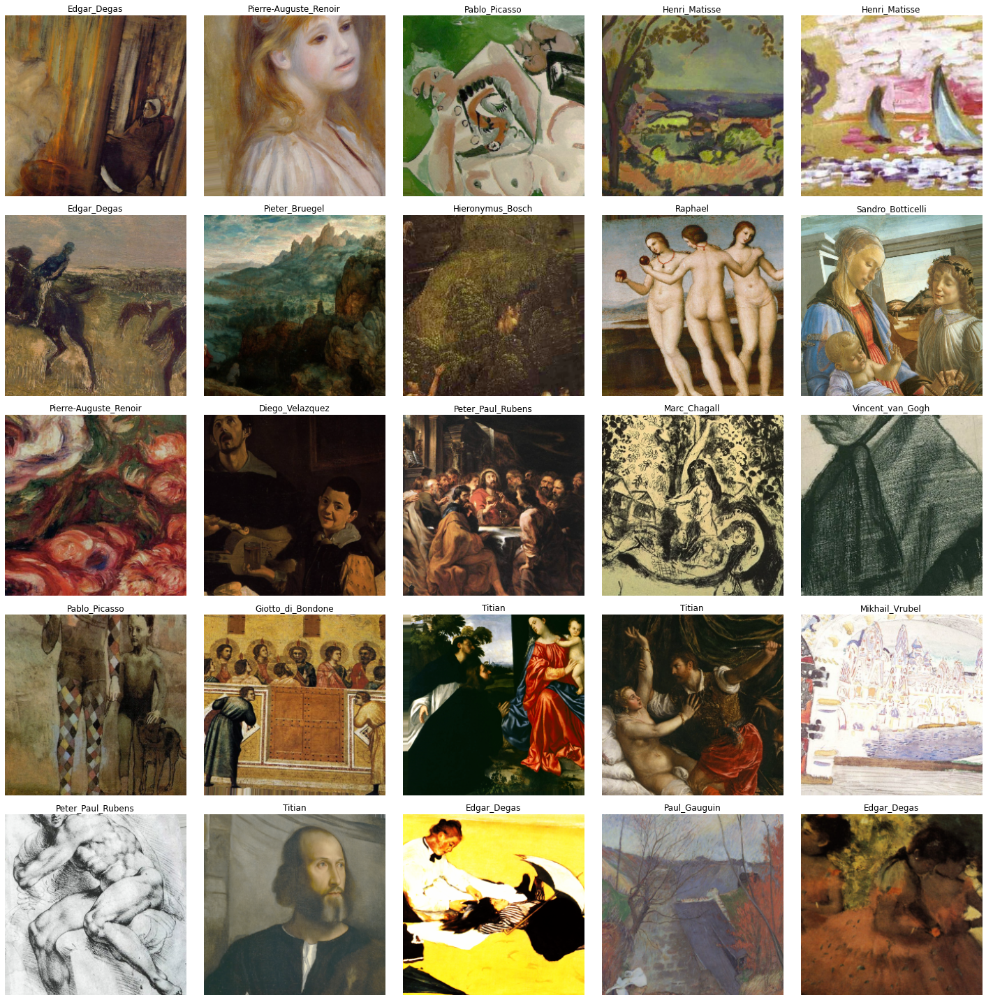

In [35]:
path = Path('../best-artworks-dataset/images/images')
tfms = get_transforms(max_rotate= 10.,max_zoom=1., max_lighting=0.20, do_flip=False, max_warp=0., xtra_tfms=[flip_lr(), brightness(change=(0.3, 0.60), p=0.7), contrast(scale=(0.5, 2), 
                      p=0.7), crop_pad(size=600, padding_mode='border', row_pct=0.,col_pct=0.), rand_zoom(scale=(1.,1.5)), rand_crop(), perspective_warp(magnitude=(-0.1,0.1)),
                      symmetric_warp(magnitude=(-0.1,0.1))])
src = (ImageList.from_folder(path).split_by_rand_pct(0.2, seed=42).label_from_folder())

data = (src.transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=128).databunch(bs=64, num_workers=0).normalize(imagenet_stats))
data_big = (src.transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=256)
        .databunch(bs=64, num_workers=0)
        .normalize(imagenet_stats))
data.show_batch()

In [36]:
dir_path = os.path.dirname(os.getcwd())
learn = cnn_learner(data, models.resnet50, metrics=accuracy, pretrained=True)
learn.load(os.path.join(dir_path, 'jupyter-notebooks', 'misc', 'final_model'))

Learner(data=ImageDataBunch;

Train: LabelList (6757 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
Albrecht_Durer,Albrecht_Durer,Albrecht_Durer,Albrecht_Durer,Albrecht_Durer
Path: ..\best-artworks-dataset\images\images;

Valid: LabelList (1689 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
Albrecht_Durer,Francisco_Goya,Joan_Miro,Albrecht_Durer,Marc_Chagall
Path: ..\best-artworks-dataset\images\images;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, ker

In [37]:
learn.model[1][4]

Linear(in_features=4096, out_features=512, bias=True)

In [38]:
class SaveFeatures():
    features=None
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module, input, output): 
        out = output.detach().cpu().numpy()
        if isinstance(self.features, type(None)):
            self.features = out
        else:
            self.features = np.row_stack((self.features, out))
    def remove(self): 
        self.hook.remove()

In [39]:
sf = SaveFeatures(learn.model[1][4])

In [40]:
_= learn.get_preds(data_big.train_ds)
_= learn.get_preds(DatasetType.Valid)
len(sf.features)

8446

In [41]:
img_path = [str(x) for x in (list(data_big.train_ds.items) +list(data_big.valid_ds.items))]
label = [data_big.classes[x] for x in (list(data_big.train_ds.y.items) +list(data_big.valid_ds.y.items))]
label_id = [x for x in (list(data_big.train_ds.y.items) +list(data_big.valid_ds.y.items))]

len(img_path), len(label), len(label_id)

(8446, 8446, 8446)

In [42]:
df_new = pd.DataFrame({'img_path': img_path, 'label': label, 'label_id': label_id})
df_new

,img_path,label,label_id
0,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0
1,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0
2,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0
3,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0
4,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0
...,...,...,...
8441,..\best-artworks-dataset\images\images\Diego_V...,Diego_Velazquez,9
8442,..\best-artworks-dataset\images\images\Edgar_D...,Edgar_Degas,10
8443,..\best-artworks-dataset\images\images\Edgar_D...,Edgar_Degas,10
8444,..\best-artworks-dataset\images\images\Vincent...,Vincent_van_Gogh,48


In [43]:
df_new['img_repr'] = np.array(sf.features).tolist()

df_new.head()

,img_path,label,label_id,img_repr
0,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0,"[0.0, 0.0, 0.9734272956848145, 1.5306733846664..."
1,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0,"[0.0, 0.0, 26.06556510925293, 0.0, 11.46798706..."
2,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0,"[0.0, 0.0, 31.00691032409668, 0.0, 22.78203773..."
3,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0,"[1.9838361740112305, 0.0, 9.133316040039062, 0..."
4,..\best-artworks-dataset\images\images\Albrech...,Albrecht_Durer,0,"[0.0, 0.0, 12.960528373718262, 1.4576480388641..."


In [91]:
df_new.to_csv(os.path.join(dir_path, 'jupyter-notebooks', 'misc', 'recomm_df.csv'), index = False, header=True)
df_new.shape

(8446, 4)

In [45]:
annoy_idx = AnnoyIndex(len(df_new['img_repr'][0]), metric='euclidean')

In [46]:
for it, vector in enumerate(df_new['img_repr']):
    annoy_idx.add_item(it, vector)
    
_ = annoy_idx.build(n_trees=50)

In [79]:
def get_similar_images_annoy(img_index):
    base_img_id, base_vector, base_label  = df_new.iloc[img_index, [0, 3, 1]]
    similar_img_ids = annoy_idx.get_nns_by_item(img_index, 8)
    return base_img_id, base_label, df_new.iloc[similar_img_ids]

Artist: Alfred_Sisley


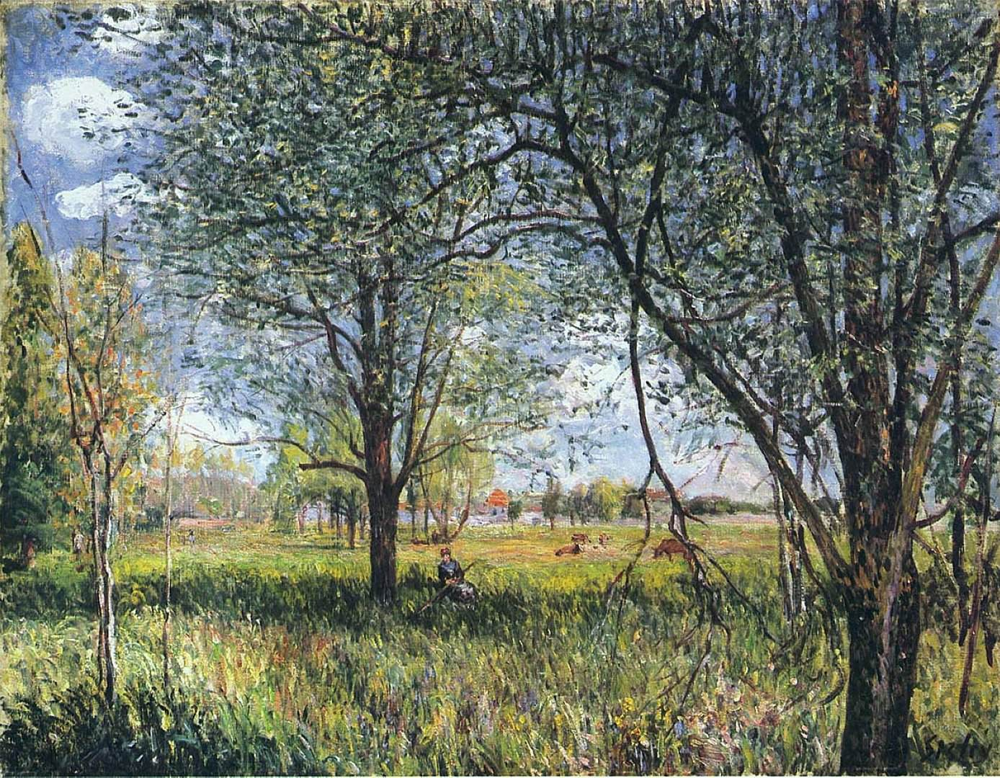

In [80]:
base_image, base_label, similar_images_df = get_similar_images_annoy(img_index=450)
print('Artist:', base_label)
open_image(base_image)

In [81]:
similar_images_df

,img_path,label,label_id,img_repr
450,..\best-artworks-dataset\images\images\Alfred_...,Alfred_Sisley,1,"[-8.188081741333008, 14.17890739440918, -13.40..."
985,..\best-artworks-dataset\images\images\Claude_...,Claude_Monet,7,"[-11.57160472869873, 11.542553901672363, -23.4..."
364,..\best-artworks-dataset\images\images\Alfred_...,Alfred_Sisley,1,"[-6.375062942504883, 0.021240293979644775, -2...."
384,..\best-artworks-dataset\images\images\Alfred_...,Alfred_Sisley,1,"[-16.491416931152344, 13.36590576171875, -15.5..."
839,..\best-artworks-dataset\images\images\Camille...,Camille_Pissarro,5,"[-8.142951965332031, 3.7278175354003906, -10.2..."
851,..\best-artworks-dataset\images\images\Camille...,Camille_Pissarro,5,"[-14.241300582885742, 4.529020309448242, -10.1..."
6193,..\best-artworks-dataset\images\images\Vincent...,Vincent_van_Gogh,48,"[-7.886404991149902, 12.268665313720703, -21.3..."
6283,..\best-artworks-dataset\images\images\Vincent...,Vincent_van_Gogh,48,"[1.6451706886291504, 5.294810771942139, -18.98..."


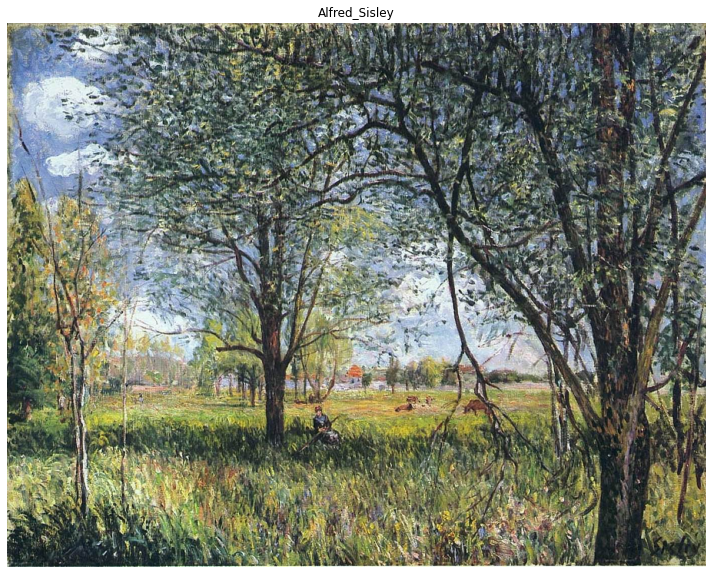

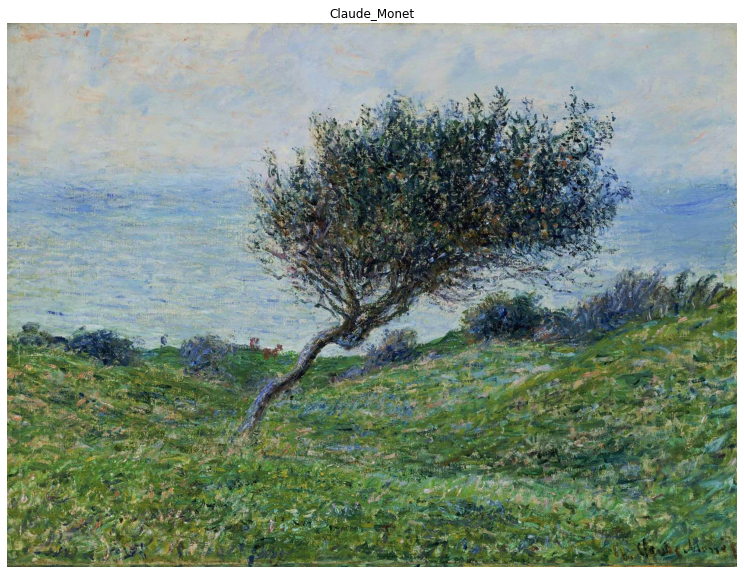

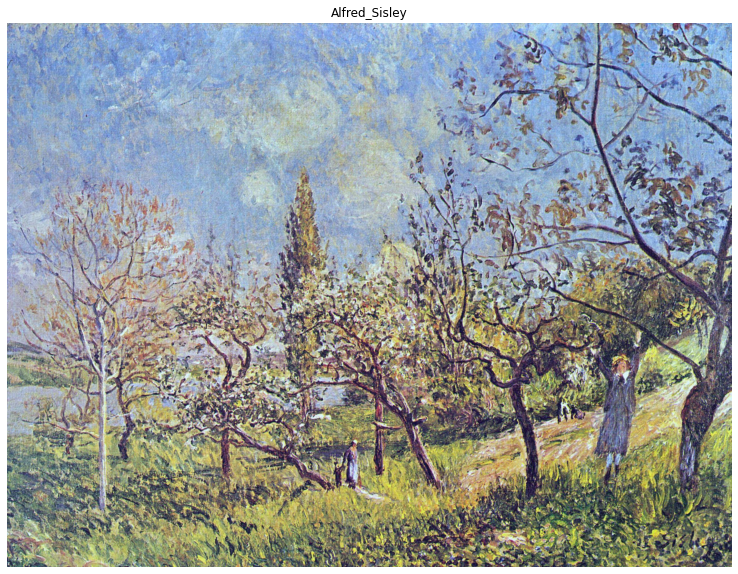

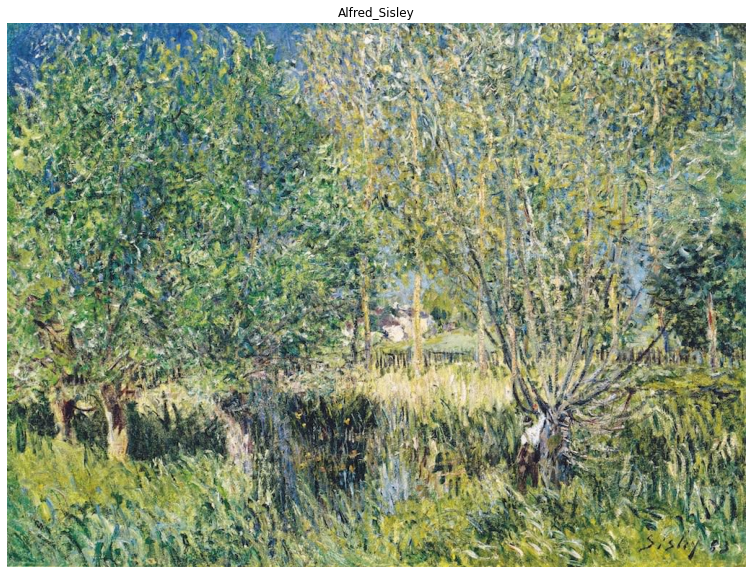

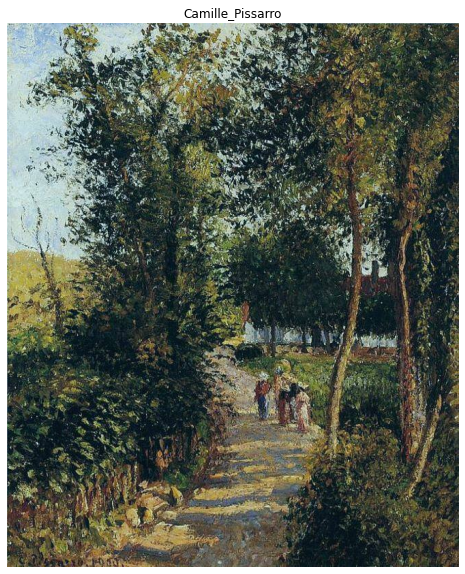

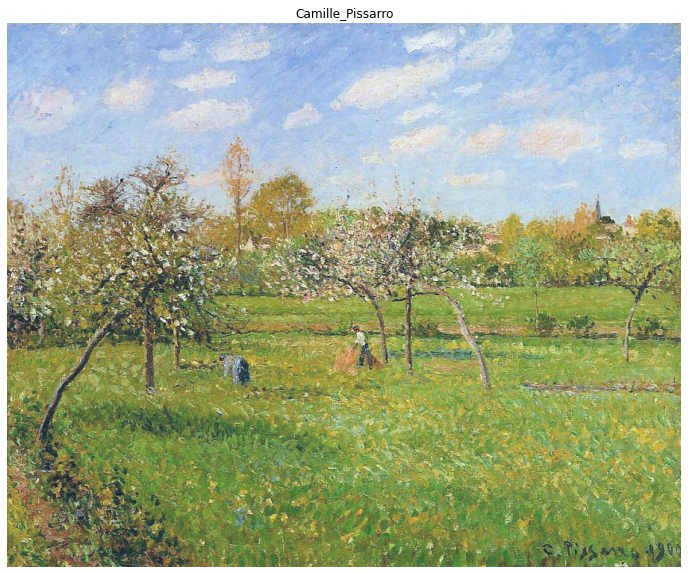

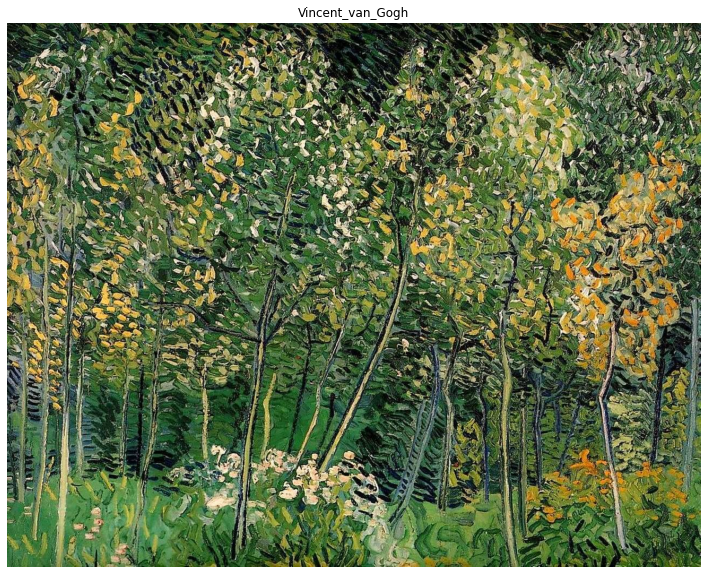

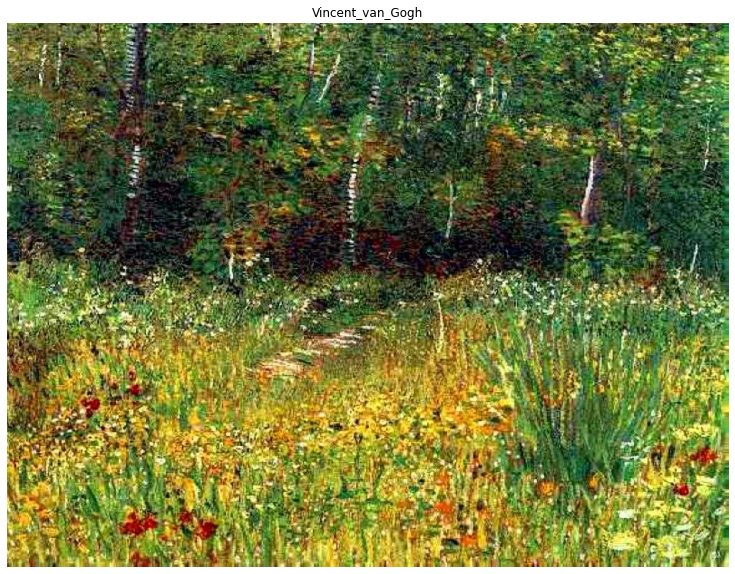

In [89]:
for idx, row in similar_images_df.iterrows():
    open_image(row['img_path']).show(figsize=(15,10), title=row['label'])